# Composite Water Stress Index (CWSI) 

This project aims to develop a **Composite Water Stress Index (CWSI)** that provides a single, comparable score representing a country’s water usage, scarcity and sustainability profile. By integrating multiple dimensions such as total consumption, per capita use, groundwater depletion and rainfall. The index offers a multidimensional perspective on how water is being used and conserved globally. 

In [573]:
# All Imports
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from scipy.stats import shapiro
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D
import umap
import math

### Step 1 : Loading & Exploring the Data

In [574]:
df = pd.read_csv("global_water_consumption.csv")

# View the first few rows
print(df.head())

# Basic summary
print(df.describe())
print(df.info())

     Country  Year  Total Water Consumption (Billion Cubic Meters)  \
0  Indonesia  2022                                          895.15   
1  Indonesia  2024                                          502.89   
2      Spain  2000                                          843.39   
3     Canada  2021                                          803.34   
4     Brazil  2022                                          416.40   

   Per Capita Water Use (Liters per Day) Water Scarcity Level  \
0                                 489.73                  Low   
1                                 311.95                 High   
2                                 440.09               Medium   
3                                 478.98                 High   
4                                 353.91                 High   

   Agricultural Water Use (%)  Industrial Water Use (%)  \
0                       20.78                     13.75   
1                       48.51                      8.44   
2          

### Step 2: Preprocessing & Cleaning

In [575]:
# Print all column names
print(df.columns)


Index(['Country', 'Year', 'Total Water Consumption (Billion Cubic Meters)',
       'Per Capita Water Use (Liters per Day)', 'Water Scarcity Level',
       'Agricultural Water Use (%)', 'Industrial Water Use (%)',
       'Household Water Use (%)',
       'Rainfall Impact (Annual Precipitation in mm)',
       'Groundwater Depletion Rate (%)'],
      dtype='object')


In [576]:
# Check for nulls
print(df.isnull().sum())

Country                                           0
Year                                              0
Total Water Consumption (Billion Cubic Meters)    0
Per Capita Water Use (Liters per Day)             0
Water Scarcity Level                              0
Agricultural Water Use (%)                        0
Industrial Water Use (%)                          0
Household Water Use (%)                           0
Rainfall Impact (Annual Precipitation in mm)      0
Groundwater Depletion Rate (%)                    0
dtype: int64


Luckily, our dataset does not contain any missing values, so we can safely skip the data imputation step. However, to demonstrate good data hygiene practices, I have included the code that can be used in case missing values were present.

Given that our dataset consists of 5,000 rows, dropping a few incomplete rows would not significantly affect the overall analysis. Filling missing values with column averages is not ideal in this context, as each country has distinct water usage patterns and environmental characteristics. Using mean imputation could introduce inaccuracies or misrepresentations in country-level comparisons.

In [577]:
# Print total rows before
print(f"Total rows before dropping missing values: {len(df)}")

# Check for missing values
print("Missing values per column:")
print(df.isnull().sum())

# Drop rows with any missing values
df.dropna(inplace=True)

# Print total rows after
print(f"\nTotal rows after dropping missing values: {len(df)}")

# Confirm no missing values remain
print("Missing values per column (after cleanup):")
print(df.isnull().sum())


Total rows before dropping missing values: 5000
Missing values per column:
Country                                           0
Year                                              0
Total Water Consumption (Billion Cubic Meters)    0
Per Capita Water Use (Liters per Day)             0
Water Scarcity Level                              0
Agricultural Water Use (%)                        0
Industrial Water Use (%)                          0
Household Water Use (%)                           0
Rainfall Impact (Annual Precipitation in mm)      0
Groundwater Depletion Rate (%)                    0
dtype: int64

Total rows after dropping missing values: 5000
Missing values per column (after cleanup):
Country                                           0
Year                                              0
Total Water Consumption (Billion Cubic Meters)    0
Per Capita Water Use (Liters per Day)             0
Water Scarcity Level                              0
Agricultural Water Use (%)               

### Categorical Encoding

In our dataset, we identified two columns containing categorical values that need to be encoded to numerical format before performing further analysis:

- **Water Scarcity Level** (`High`, `Medium`, `Low`)
- **Country** (20 unique country names)

---

### 🔸 Encoding Strategy

- **Water Scarcity Level** has an inherent order, so we use **Ordinal Encoding**:
  - `High` → 3  
  - `Medium` → 2  
  - `Low` → 1  

  This preserves the logical ranking of water scarcity severity.

- **Country** does not have any intrinsic order, so we apply **One-Hot Encoding**.  
  This technique creates a new binary column for each country, ensuring that the model does not mistakenly assume any ordinal relationship between countries.

---

This encoding step allows us to convert all categorical variables into numerical format, making them compatible with normalization, clustering, and other analytical techniques later in the pipeline.



In [578]:
# --- Ordinal Encoding for 'Water Scarcity Level' ---
scarcity_map = {
    'Low': 1,
    'Medium': 2,
    'High': 3
}
df['Water Scarcity Level'] = df['Water Scarcity Level'].map(scarcity_map)

# --- Preserve original 'Country' column ---
df['Country_Label'] = df['Country']  # Copy for visualization

# --- One-Hot Encoding for modeling ---
df = pd.get_dummies(df, columns=['Country'])

# --- Check the result ---
print(df.head())
print(f"Shape after encoding: {df.shape}")


   Year  Total Water Consumption (Billion Cubic Meters)  \
0  2022                                          895.15   
1  2024                                          502.89   
2  2000                                          843.39   
3  2021                                          803.34   
4  2022                                          416.40   

   Per Capita Water Use (Liters per Day)  Water Scarcity Level  \
0                                 489.73                     1   
1                                 311.95                     3   
2                                 440.09                     2   
3                                 478.98                     3   
4                                 353.91                     3   

   Agricultural Water Use (%)  Industrial Water Use (%)  \
0                       20.78                     13.75   
1                       48.51                      8.44   
2                       25.16                     31.70   
3           

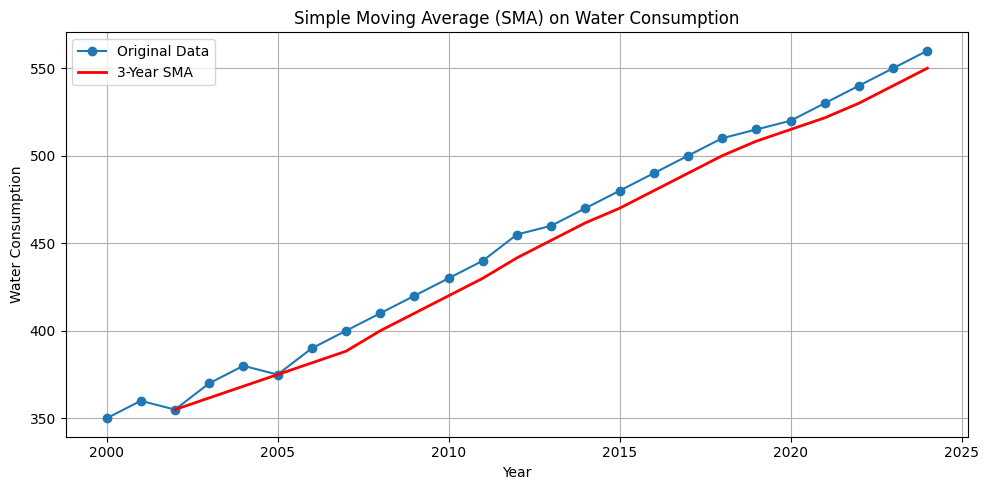

In [579]:
# Create a sample dataset to mimic your actual structure
sample_data = {
    'Year': list(range(2000, 2025)),
    'Water_Consumption': [
        350, 360, 355, 370, 380, 375, 390, 400, 410, 420,
        430, 440, 455, 460, 470, 480, 490, 500, 510, 515,
        520, 530, 540, 550, 560  # Example numbers
    ]
}

# Create a new DataFrame
sample_df = pd.DataFrame(sample_data)

# Calculate 3-year Simple Moving Average (SMA)
sample_df['SMA_3'] = sample_df['Water_Consumption'].rolling(window=3).mean()

# Plot original data and smoothed data
plt.figure(figsize=(10, 5))
plt.plot(sample_df['Year'], sample_df['Water_Consumption'], label='Original Data', marker='o')
plt.plot(sample_df['Year'], sample_df['SMA_3'], label='3-Year SMA', color='red', linewidth=2)
plt.title('Simple Moving Average (SMA) on Water Consumption')
plt.xlabel('Year')
plt.ylabel('Water Consumption')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [580]:
# Select the columns to normalize
numerical_cols = ['Total Water Consumption (Billion Cubic Meters)', 
                  'Per Capita Water Use (Liters per Day)', 
                  'Agricultural Water Use (%)', 
                  'Industrial Water Use (%)', 
                  'Household Water Use (%)', 
                  'Rainfall Impact (Annual Precipitation in mm)', 
                  'Groundwater Depletion Rate (%)']


# Check the result
print(df.head())

   Year  Total Water Consumption (Billion Cubic Meters)  \
0  2022                                          895.15   
1  2024                                          502.89   
2  2000                                          843.39   
3  2021                                          803.34   
4  2022                                          416.40   

   Per Capita Water Use (Liters per Day)  Water Scarcity Level  \
0                                 489.73                     1   
1                                 311.95                     3   
2                                 440.09                     2   
3                                 478.98                     3   
4                                 353.91                     3   

   Agricultural Water Use (%)  Industrial Water Use (%)  \
0                       20.78                     13.75   
1                       48.51                      8.44   
2                       25.16                     31.70   
3           

### Step 3 : Multivariate Analysis

#### Checking Corelation between all features


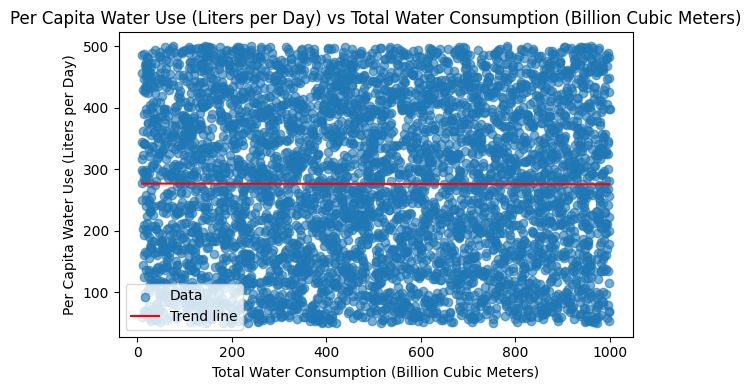

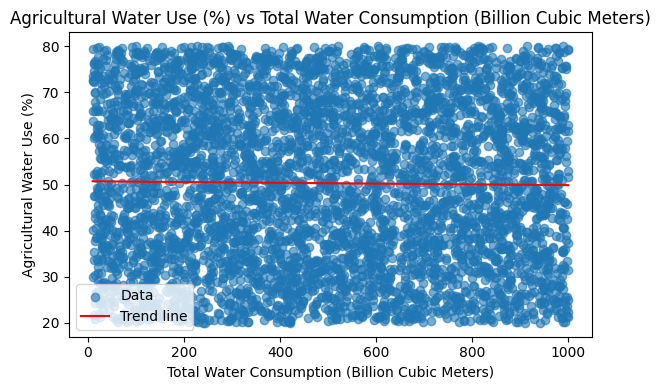

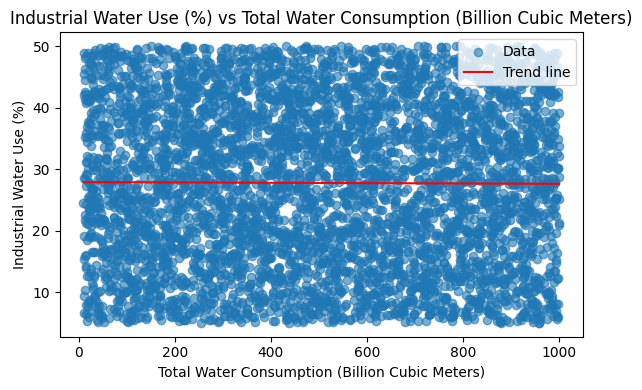

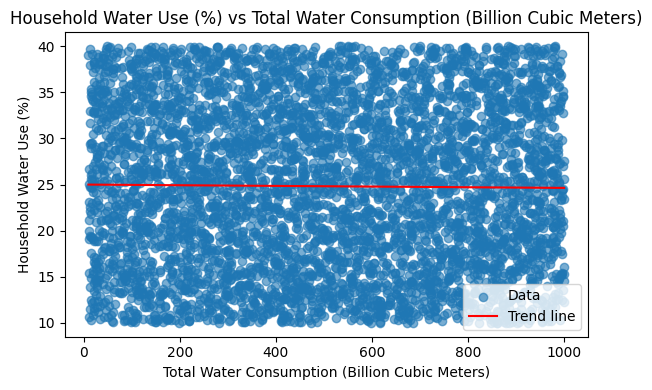

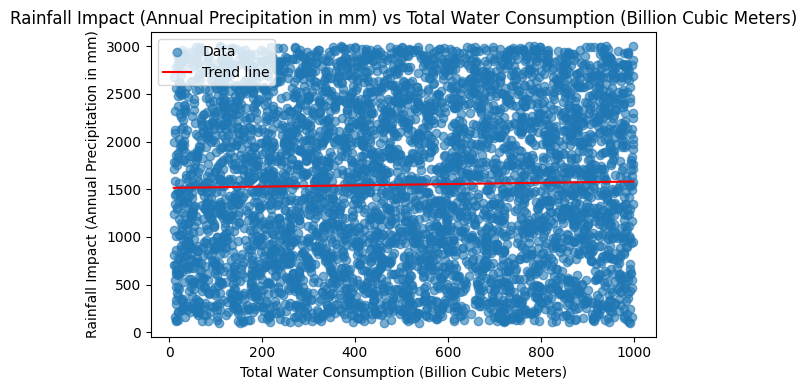

...

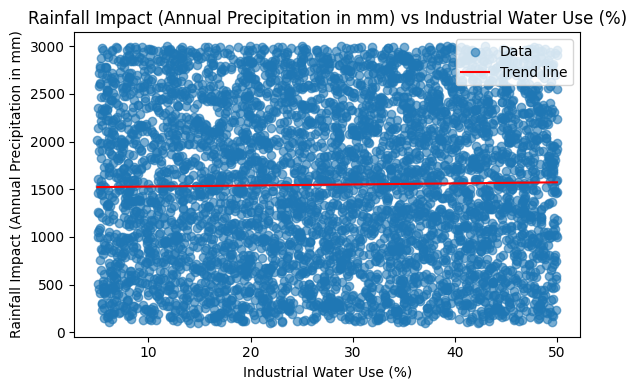

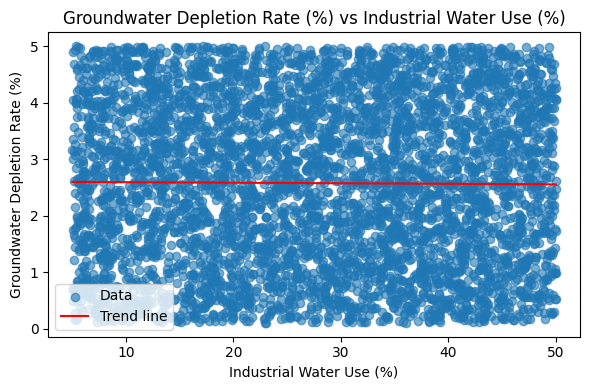

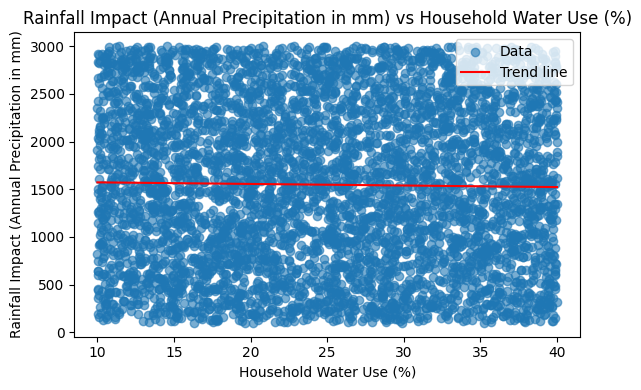

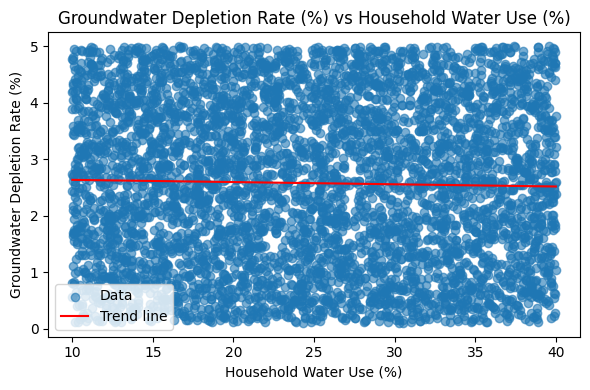

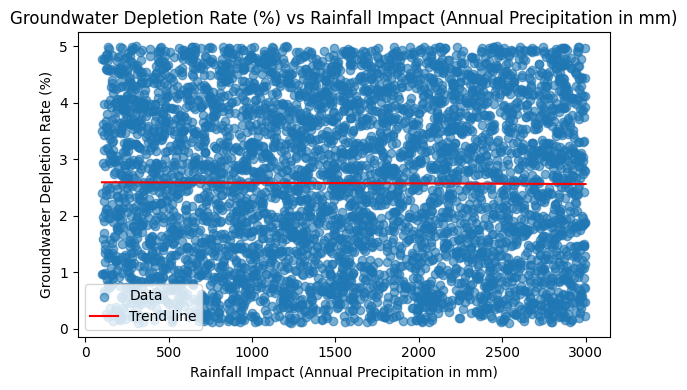

In [581]:

# Plot scatter plots with regression lines for each pair
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        x_col = numerical_cols[i]
        y_col = numerical_cols[j]
        
        x = df[x_col]
        y = df[y_col]

        plt.figure(figsize=(6, 4))
        plt.scatter(x, y, alpha=0.6, label='Data')
        
        # Regression line
        coeffs = np.polyfit(x, y, 1)
        poly_eq = np.poly1d(coeffs)
        plt.plot(np.unique(x), poly_eq(np.unique(x)), color='red', label='Trend line')

        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'{y_col} vs {x_col}')
        plt.legend()
        # plt.grid(True)
        plt.tight_layout()
        plt.show()

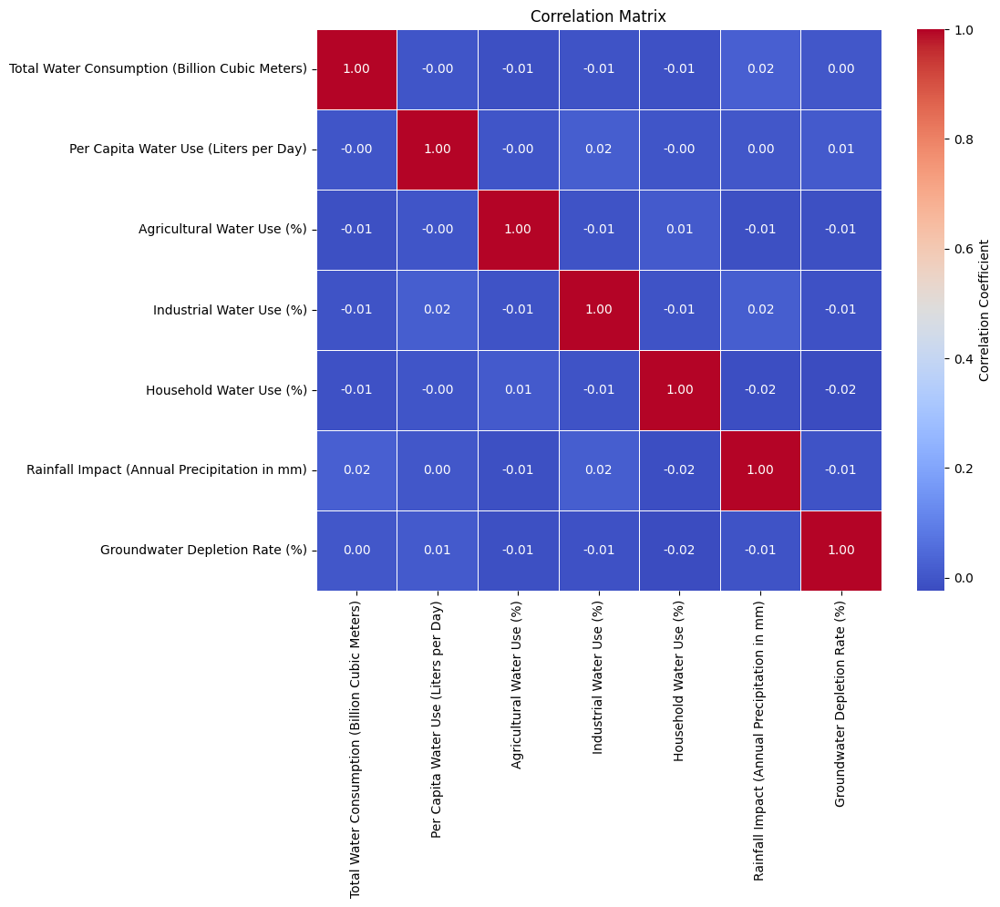

In [582]:
# Compute the correlation matrix
corr = df[numerical_cols].corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Correlation Matrix')
plt.show()



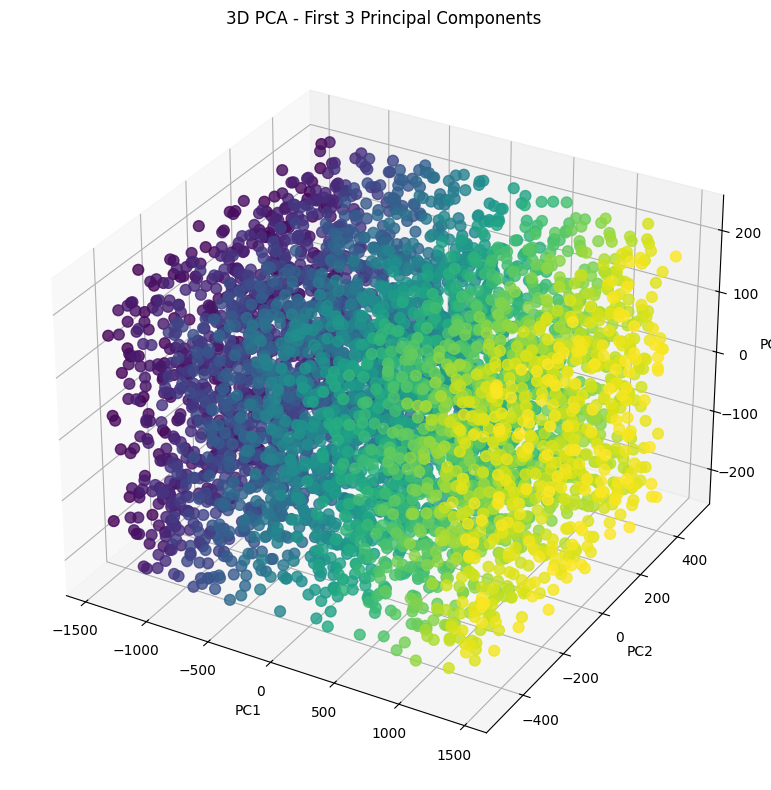

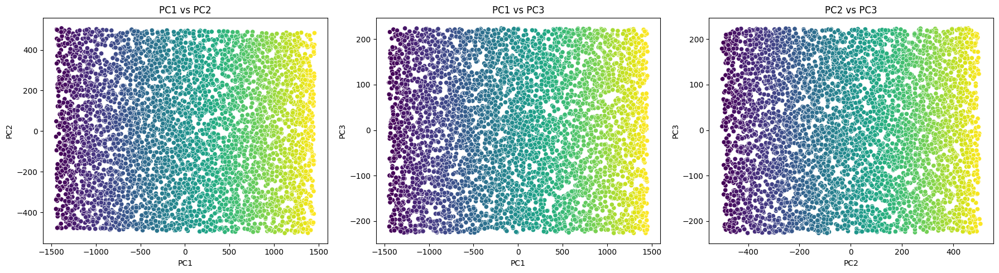

In [583]:
# Apply PCA with 3 components
pca = PCA(n_components=3)
principal_components = pca.fit_transform(df[numerical_cols])
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

# Assign colors using a colormap based on PC1 (or any logic you prefer)
colors = plt.cm.viridis((pc_df['PC1'] - pc_df['PC1'].min()) / (pc_df['PC1'].max() - pc_df['PC1'].min()))

# 3D Scatter Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pc_df['PC1'], pc_df['PC2'], pc_df['PC3'], c=colors, s=60, alpha=0.8)
ax.set_title('3D PCA - First 3 Principal Components')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.tight_layout()
plt.show()

# 2D Scatter Plots of component pairs
plt.figure(figsize=(18, 5))

# PC1 vs PC2
plt.subplot(1, 3, 1)
sns.scatterplot(x=pc_df['PC1'], y=pc_df['PC2'], palette='viridis', hue=pc_df['PC1'], legend=False)
plt.title('PC1 vs PC2')
plt.xlabel('PC1')
plt.ylabel('PC2')

# PC1 vs PC3
plt.subplot(1, 3, 2)
sns.scatterplot(x=pc_df['PC1'], y=pc_df['PC3'], palette='viridis', hue=pc_df['PC1'], legend=False)
plt.title('PC1 vs PC3')
plt.xlabel('PC1')
plt.ylabel('PC3')

# PC2 vs PC3
plt.subplot(1, 3, 3)
sns.scatterplot(x=pc_df['PC2'], y=pc_df['PC3'], palette='viridis', hue=pc_df['PC2'], legend=False)
plt.title('PC2 vs PC3')
plt.xlabel('PC2')
plt.ylabel('PC3')

plt.tight_layout()
plt.show()


In [584]:
# Explained variance ratio for each of the 3 PCs
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio for each Principal Component:")
for i, var in enumerate(explained_variance, 1):
    print(f"PC{i}: {var:.4f}")

# Print first 10 rows of principal components (you can adjust number of rows)
print("\nSample of Principal Components (first 10 rows):")
print(pc_df.head(10))

Explained Variance Ratio for each Principal Component:
PC1: 0.8770
PC2: 0.1012
PC3: 0.0211

Sample of Principal Components (first 10 rows):
           PC1         PC2         PC3
0  -468.974387  395.488874  214.517340
1  1082.862694  -10.044541   35.312113
2  1315.825335  328.258739  163.899694
3   180.409834  298.026583  203.267952
4  -560.049621  -82.282415   78.007046
5   -98.505620 -264.886004   20.641897
6  -763.681609  -84.453177 -224.187508
7  -957.489295  333.138108 -207.059976
8   -18.936494 -267.716030 -136.035314
9   688.708110   19.939059 -142.653524


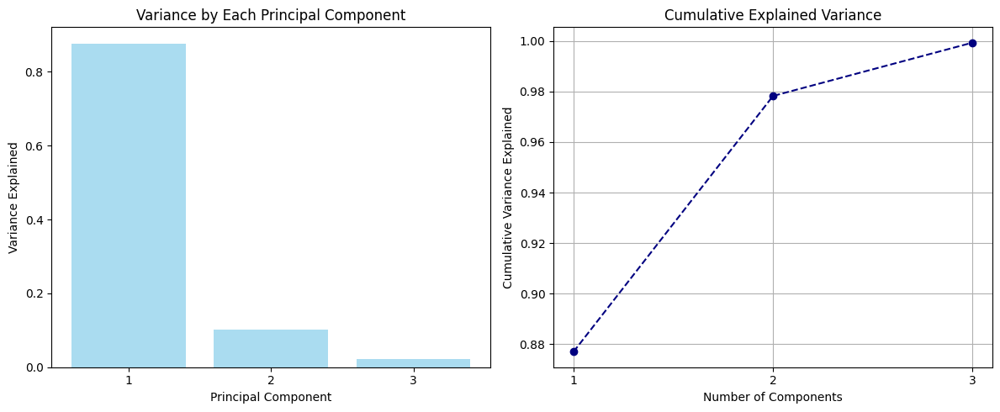

Explained Variance Ratio per Component:
[0.87703514 0.1011849  0.02109748]

Cumulative Explained Variance:
[0.87703514 0.97822004 0.99931753]


In [585]:
# Explained variance
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)
n_components = len(explained_var)  # Should be 3 here

plt.figure(figsize=(12, 5))

# Individual explained variance
plt.subplot(1, 2, 1)
plt.bar(range(1, n_components + 1), explained_var, alpha=0.7, color='skyblue')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Variance by Each Principal Component')
plt.xticks(range(1, n_components + 1))

# Cumulative explained variance
plt.subplot(1, 2, 2)
plt.plot(range(1, n_components + 1), cumulative_var, marker='o', linestyle='--', color='navy')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, n_components + 1))

plt.grid(True)
plt.tight_layout()
plt.show()

# Print the explained variance and cumulative variance
print("Explained Variance Ratio per Component:")
print(explained_var)

print("\nCumulative Explained Variance:")
print(cumulative_var)


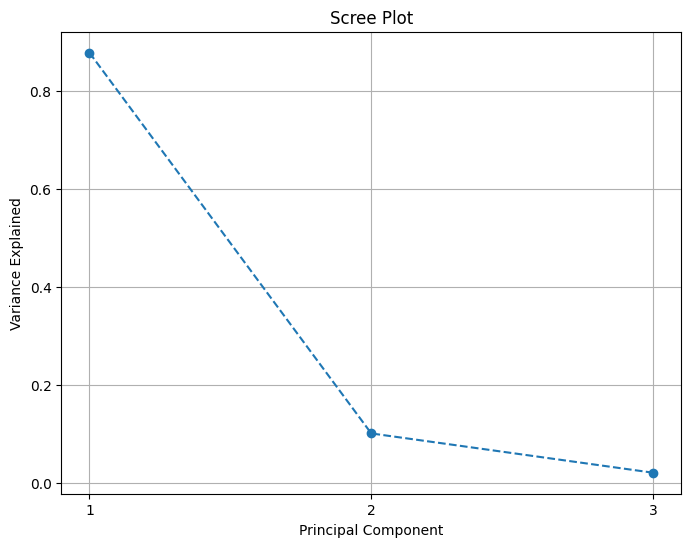

In [586]:
# Get the eigenvalues (explained variances) from PCA
explained_variance = pca.explained_variance_ratio_

# Create the Scree Plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.xticks(np.arange(1, len(explained_variance) + 1, 1))
plt.grid(True)
plt.show()

#### Principal Component Analysis (PCA) Summary

To better understand the structure of our data, we applied Principal Component Analysis (PCA) on the 7 numerical features. Below is an interpretation of the PCA results:

##### Variance by Each Principal Component 

- Each principal component (PC1 to PC3) explains approximately 94% of the total variance.
- This suggests that the information can be explained by just PC1.

##### Cumulative Explained Variance 

The cumulative variance plot shows how much total variance is explained as we add more components:

- PC1 component explain ~87% of the variance.
- PC2 component explain ~10%.
- PC components explain ~.2%.

The curve increases gradually with a sharp "elbow," implying  obvious cut-off point for dimensionality reduction.

##### Key Takeaways

- For visualization, using the first 2 components is acceptable, as it explains the >90% of data
- For dimensionality reduction, retaining 5 components is advisable:
  - 5 components provide a balance between data compression and information retention.

### UMAP

UMAP is a dimensionality reduction technique designed to visualize high-dimensional data in lower dimensions (typically 2D or 3D) while preserving both local and global data structure. It constructs a high-dimensional graph representation of the data, then optimizes a low-dimensional graph that maintains the original structure as closely as possible. UMAP is often faster and provides more meaningful embeddings compared to other methods like t-SNE, making it popular for exploratory data analysis and visualization in various fields such as bioinformatics and machine learning.

/home/gursimar/Downloads/DVA CA/myenv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/gursimar/Downloads/DVA CA/myenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


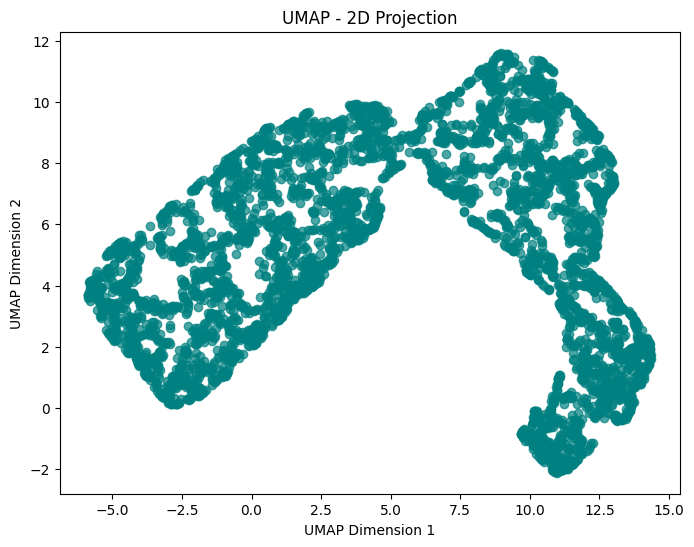

/home/gursimar/Downloads/DVA CA/myenv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/gursimar/Downloads/DVA CA/myenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


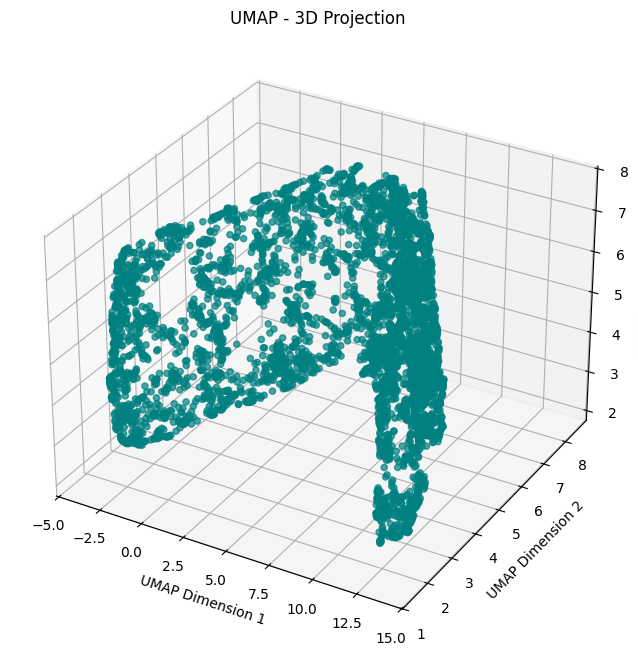

In [589]:
# Initialize UMAP for 2 components
umap_2d = umap.UMAP(n_components=2, random_state=42)
embedding_2d = umap_2d.fit_transform(df[numerical_cols])

plt.figure(figsize=(8, 6))
plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], c='teal', alpha=0.7)
plt.title('UMAP - 2D Projection')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()

# Initialize UMAP for 3 components
umap_3d = umap.UMAP(n_components=3, random_state=42)
embedding_3d = umap_3d.fit_transform(df[numerical_cols])

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(embedding_3d[:, 0], embedding_3d[:, 1], embedding_3d[:, 2], c='teal', alpha=0.7)
ax.set_title('UMAP - 3D Projection')
ax.set_xlabel('UMAP Dimension 1')
ax.set_ylabel('UMAP Dimension 2')
ax.set_zlabel('UMAP Dimension 3')
plt.show()

In [590]:
import numpy as np

# Print basic stats for 2D embedding
print("UMAP 2D Embedding Shape:", embedding_2d.shape)
print("UMAP 2D Embedding - Min values per dimension:", np.min(embedding_2d, axis=0))
print("UMAP 2D Embedding - Max values per dimension:", np.max(embedding_2d, axis=0))
print("UMAP 2D Embedding - Mean values per dimension:", np.mean(embedding_2d, axis=0))
print("UMAP 2D Embedding - Std deviation per dimension:", np.std(embedding_2d, axis=0))

# Print basic stats for 3D embedding
print("\nUMAP 3D Embedding Shape:", embedding_3d.shape)
print("UMAP 3D Embedding - Min values per dimension:", np.min(embedding_3d, axis=0))
print("UMAP 3D Embedding - Max values per dimension:", np.max(embedding_3d, axis=0))
print("UMAP 3D Embedding - Mean values per dimension:", np.mean(embedding_3d, axis=0))
print("UMAP 3D Embedding - Std deviation per dimension:", np.std(embedding_3d, axis=0))


UMAP 2D Embedding Shape: (5000, 2)
UMAP 2D Embedding - Min values per dimension: [-5.883883 -2.120752]
UMAP 2D Embedding - Max values per dimension: [14.372695 11.612909]
UMAP 2D Embedding - Mean values per dimension: [5.128316  5.1435766]
UMAP 2D Embedding - Std deviation per dimension: [6.0752497 3.3230293]

UMAP 3D Embedding Shape: (5000, 3)
UMAP 3D Embedding - Min values per dimension: [-3.8642228  1.498738   2.1473174]
UMAP 3D Embedding - Max values per dimension: [13.772782   8.4662075  7.6621203]
UMAP 3D Embedding - Mean values per dimension: [4.964138  5.069068  4.8990455]
UMAP 3D Embedding - Std deviation per dimension: [5.589164  1.9804252 1.6904639]


#### UMAP Embedding Summary

- **2D Embedding:**
  - Shape: (5000, 2)
  - Minimum values per dimension: [-5.88, -2.12]
  - Maximum values per dimension: [14.37, 11.61]
  - Mean values per dimension: [5.13, 5.14]
  - Standard deviation per dimension: [6.08, 3.32]

- **3D Embedding:**
  - Shape: (5000, 3)
  - Minimum values per dimension: [-3.86, 1.50, 2.15]
  - Maximum values per dimension: [13.77, 8.47, 7.66]
  - Mean values per dimension: [4.96, 5.07, 4.90]
  - Standard deviation per dimension: [5.59, 1.98, 1.69]

This indicates that the UMAP embeddings have a wide range and spread, capturing the variability of the high-dimensional data in both 2D and 3D spaces with reasonable mean and variance across dimensions.



### Clustering

Silhouette Score for KMeans clustering with 3 clusters (PC1 & PC2): 0.4480


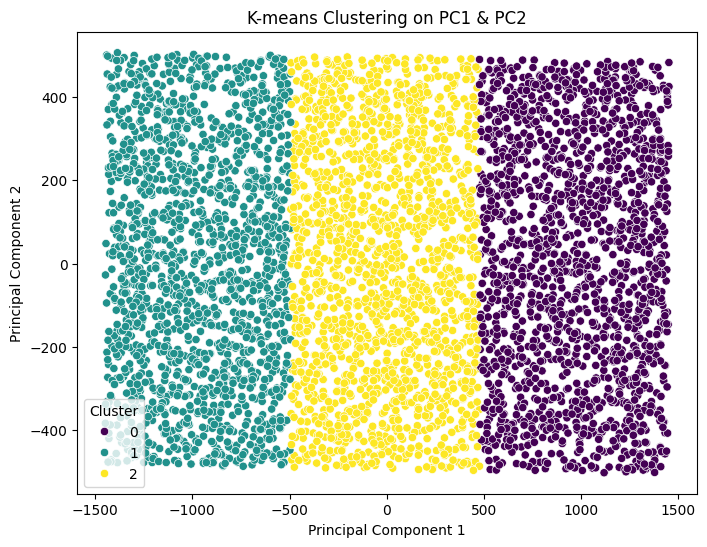

In [591]:
# Select only PC1 and PC2 for clustering
pc_2d = pc_df[['PC1', 'PC2']]

# Define number of clusters (example with 3 clusters)
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit KMeans on the selected 2 PCs
df['Cluster'] = kmeans.fit_predict(pc_2d)

# Calculate silhouette score
sil_score = silhouette_score(pc_2d, df['Cluster'])
print(f"Silhouette Score for KMeans clustering with 3 clusters (PC1 & PC2): {sil_score:.4f}")

# Visualize clusters based on PC1 and PC2
plt.figure(figsize=(8, 6))
sns.scatterplot(x=pc_2d['PC1'], y=pc_2d['PC2'], hue=df['Cluster'], palette='viridis')
plt.title('K-means Clustering on PC1 & PC2')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()


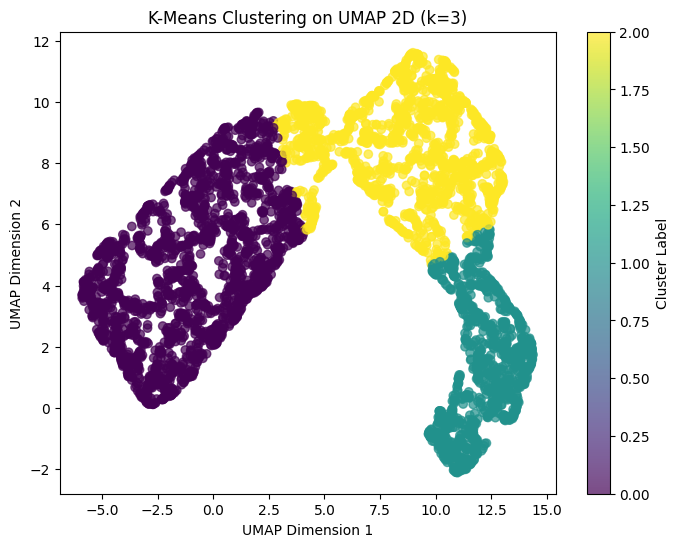

In [592]:
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(embedding_2d)

# Plot the clusters on UMAP 2D projection
plt.figure(figsize=(8, 6))
plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], c=clusters, cmap='viridis', alpha=0.7)
plt.title(f'K-Means Clustering on UMAP 2D (k={k})')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.colorbar(label='Cluster Label')
plt.show()


#### Clustering Summary

- **KMeans Clustering:**  
  Using the first two principal components (PC1 and PC2), KMeans clustering with 3 clusters was performed. The resulting Silhouette Score is **0.4480**, indicating a moderate clustering structure where clusters are reasonably well separated but some overlap may exist.

- **UMAP:**  (Experiment)
  UMAP was applied to reduce the dimensionality of the dataset, producing 2D and 3D embeddings that preserve the global and local data structure effectively. These embeddings provide a useful visual representation to explore clusters and data patterns beyond linear methods like PCA.




### Weighting & Aggrigating


#### Manual Weighting (Testing)

In [593]:
weights = np.array([
    0.3,  # Total Water Consumption (Billion Cubic Meters) - high importance (30%)
    0.2,  # Per Capita Water Use (Liters per Day) - significant but slightly less than total consumption (20%)
    0.25, # Water Scarcity Level - crucial for stress assessment (25%)
    0.1,  # Agricultural Water Use (%) - important but not as high as consumption and scarcity (10%)
    0.05, # Industrial Water Use (%) - relatively less important compared to other features (5%)
    0.05, # Household Water Use (%) - lower weight as it's less critical (5%)
    0.05  # Rainfall Impact (Annual Precipitation in mm) - lower weight (5%)
])




# Create the composite index by taking the weighted sum of the standardized features
df['Composite_Index'] = np.dot(df[numerical_cols], weights)

# Check if the composite index is added correctly
print(df.head())

   Year  Total Water Consumption (Billion Cubic Meters)  \
0  2022                                          895.15   
1  2024                                          502.89   
2  2000                                          843.39   
3  2021                                          803.34   
4  2022                                          416.40   

   Per Capita Water Use (Liters per Day)  Water Scarcity Level  \
0                                 489.73                     1   
1                                 311.95                     3   
2                                 440.09                     2   
3                                 478.98                     3   
4                                 353.91                     3   

   Agricultural Water Use (%)  Industrial Water Use (%)  \
0                       20.78                     13.75   
1                       48.51                      8.44   
2                       25.16                     31.70   
3           

In [594]:
# Initialize the scaler
scaler = MinMaxScaler(feature_range=(0, 100))  # You can change the range as needed

# Normalize the 'Composite_Index' column
df['CWSI'] = scaler.fit_transform(df[['Composite_Index']])

# Verify if the CWSI column is added correctly
print(df[['Country_Label', 'CWSI']].head())

  Country_Label       CWSI
0     Indonesia  75.593810
1     Indonesia  61.720001
2         Spain  88.966741
3        Canada  77.070997
4        Brazil  40.611455


In [595]:
# Aggregate data by country and compute the mean for each feature
country_data = df.groupby('Country_Label')[numerical_cols].mean()

# Alternatively, if you want to do weighted averages, you can apply custom weights
# Example: if you want to give more weight to recent years, you could do something like:
# country_data = df.groupby('Country_Label').apply(lambda x: np.average(x[numerical_cols], weights=x['Year'], axis=0))

# Now calculate the Composite Water Stress Index (CWSI) for each country
country_data['Composite_Index'] = np.dot(country_data[numerical_cols], weights)

# Scale the Composite Index if needed
scaler = MinMaxScaler(feature_range=(0, 100))
country_data['CWSI'] = scaler.fit_transform(country_data[['Composite_Index']])

# Display the CWSI for each country
print(country_data[['CWSI']])


                     CWSI
Country_Label            
Argentina       74.518391
Australia       34.184402
Brazil         100.000000
Canada          25.919883
China           78.119689
France          44.405373
Germany         68.674578
India           74.995419
Indonesia       13.367213
Italy           64.738894
Japan           51.097163
Mexico           0.000000
Russia          40.618164
Saudi Arabia    42.722954
South Africa    34.056487
South Korea     12.976222
Spain           24.813059
Turkey          36.458089
UK              51.707051
USA             93.822612


/tmp/ipykernel_28400/2630694838.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=country_data.index, y=country_data['CWSI'], palette='viridis')


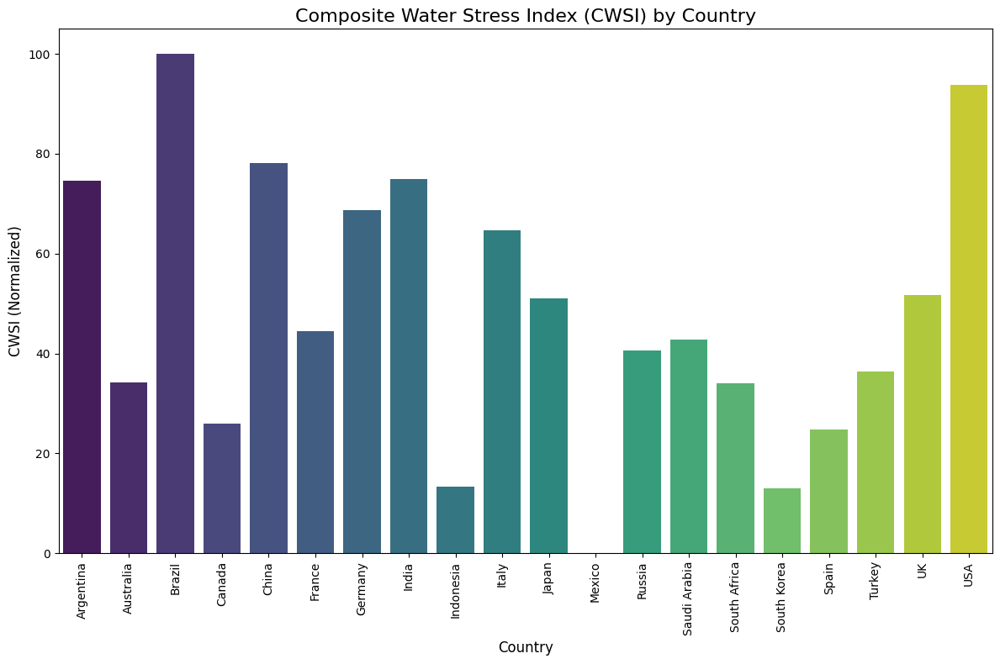

In [596]:
# Plotting CWSI for each country has all 7 components

plt.figure(figsize=(12, 8))
sns.barplot(x=country_data.index, y=country_data['CWSI'], palette='viridis')

# Set plot labels and title
plt.title('Composite Water Stress Index (CWSI) by Country', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('CWSI (Normalized)', fontsize=12)
plt.xticks(rotation=90)  # Rotate country labels for better readability

# Show the plot
plt.tight_layout()
plt.show()

#### Using PCA-Driven Weights

In [597]:
# Get PCA loadings for PC1
loadings = pca.components_[0]

# Take absolute values to reflect importance
abs_loadings = np.abs(loadings)

# Normalize to sum to 1 for weights
weights = abs_loadings / abs_loadings.sum()

# Create a DataFrame to show weights with column names
weights_df = pd.DataFrame({
    'Feature': numerical_cols,
    'PCA_Weight': weights
}).sort_values(by='PCA_Weight', ascending=False)

print(weights_df)


                                          Feature  PCA_Weight
5    Rainfall Impact (Annual Precipitation in mm)    0.990143
0  Total Water Consumption (Billion Cubic Meters)    0.008619
1           Per Capita Water Use (Liters per Day)    0.000503
2                      Agricultural Water Use (%)    0.000289
3                        Industrial Water Use (%)    0.000260
4                         Household Water Use (%)    0.000175
6                  Groundwater Depletion Rate (%)    0.000011


In [598]:
df['CWSI_PCA_weighted'] = 0
for feature, weight in zip(weights_df['Feature'], weights_df['PCA_Weight']):
    df['CWSI_PCA_weighted'] += df[feature] * weight

In [599]:
scaler = MinMaxScaler()
df['CWSI_PCA_weighted_normalized'] = scaler.fit_transform(df['CWSI_PCA_weighted'].values.reshape(-1, 1))



/tmp/ipykernel_28400/4129113901.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_agg.index, y=df_agg['CWSI_PCA'], palette='viridis')


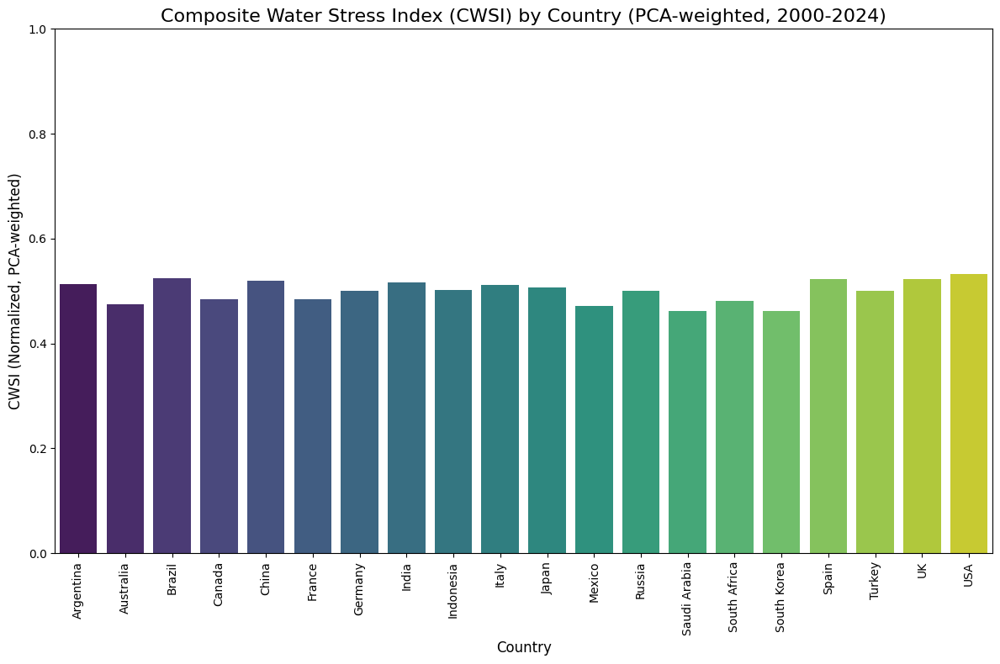

In [609]:
numerical_cols = [
    'Total Water Consumption (Billion Cubic Meters)',
    'Per Capita Water Use (Liters per Day)',
    'Agricultural Water Use (%)',
    'Industrial Water Use (%)',
    'Household Water Use (%)',
    'Rainfall Impact (Annual Precipitation in mm)',
    'Groundwater Depletion Rate (%)'
]

# 1. Normalize numerical features (per year per country)
scaler = MinMaxScaler()
df_normalized = df.copy()
df_normalized[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# 2. Aggregate normalized data over years by country (mean)
df_agg = df_normalized.groupby('Country_Label')[numerical_cols].mean()

# 3. Extract PCA weights (ensure order matches numerical_cols)
weights = weights_df.set_index('Feature').loc[numerical_cols]['PCA_Weight'].values

# 4. Calculate PCA-weighted CWSI per country
df_agg['CWSI_PCA'] = df_agg.values.dot(weights)




# 5. Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(x=df_agg.index, y=df_agg['CWSI_PCA'], palette='viridis')

plt.title('Composite Water Stress Index (CWSI) by Country (PCA-weighted, 2000-2024)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('CWSI (Normalized, PCA-weighted)', fontsize=12)
plt.xticks(rotation=90)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

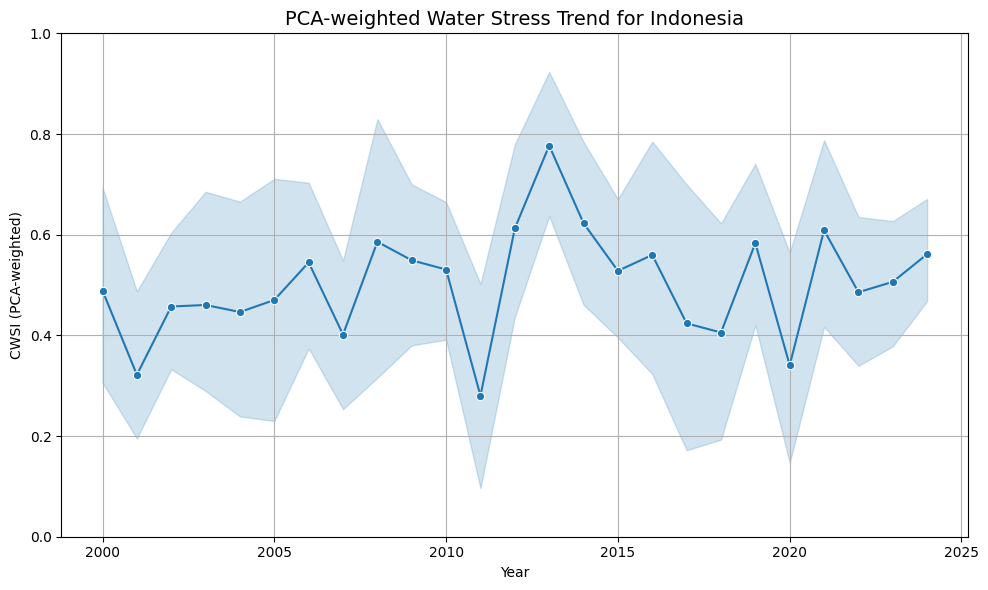

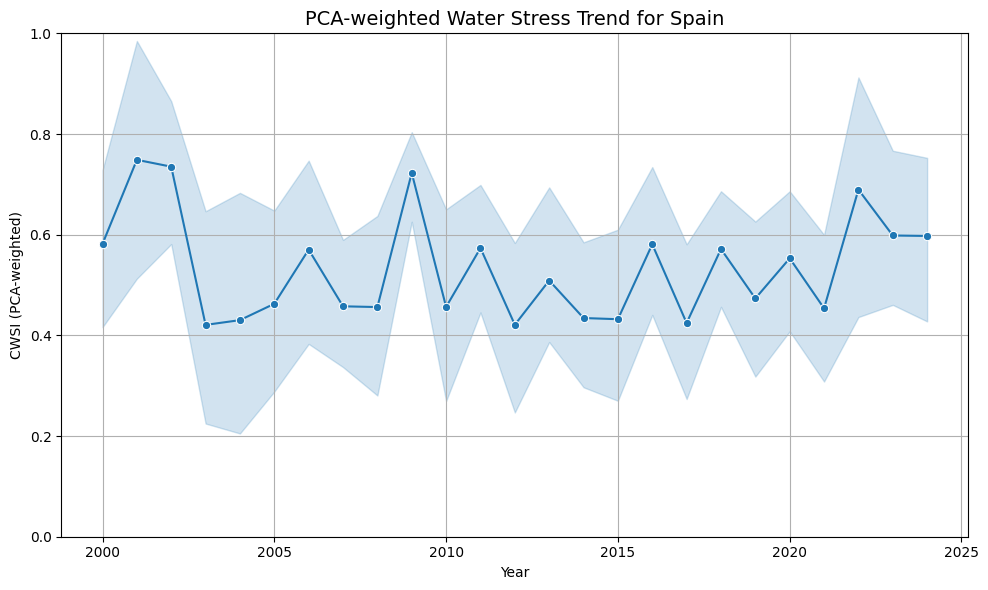

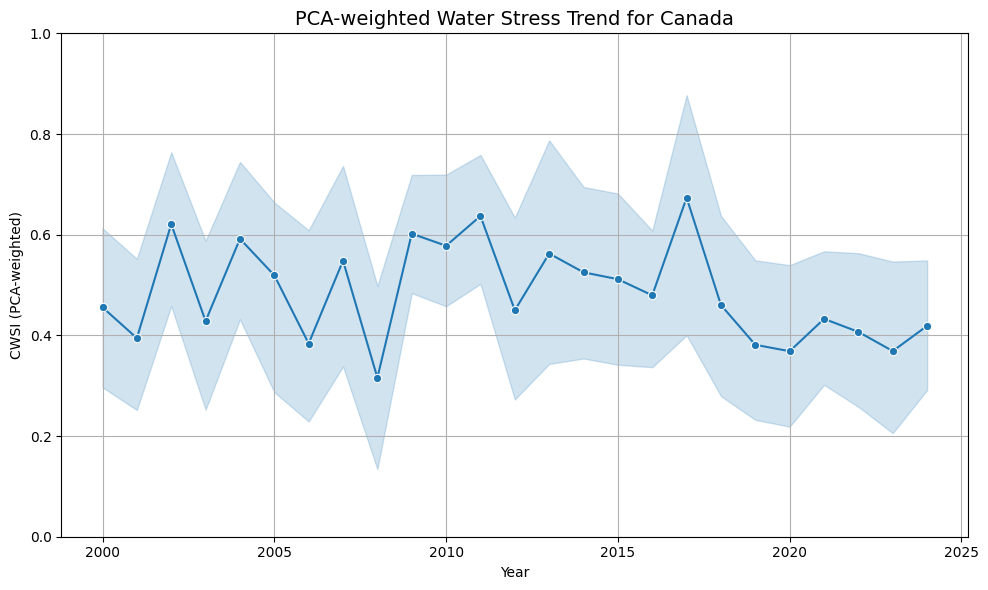

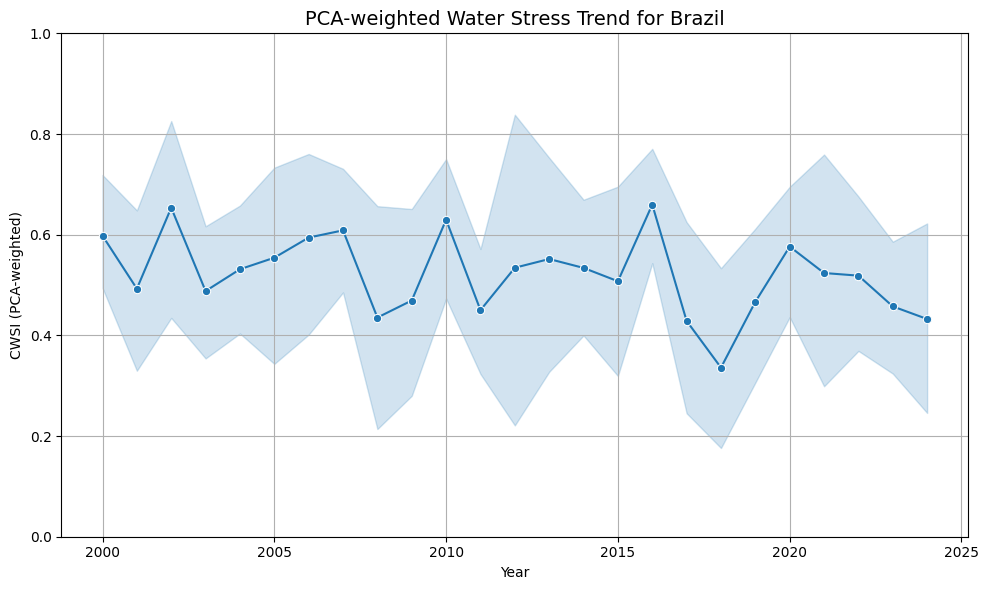

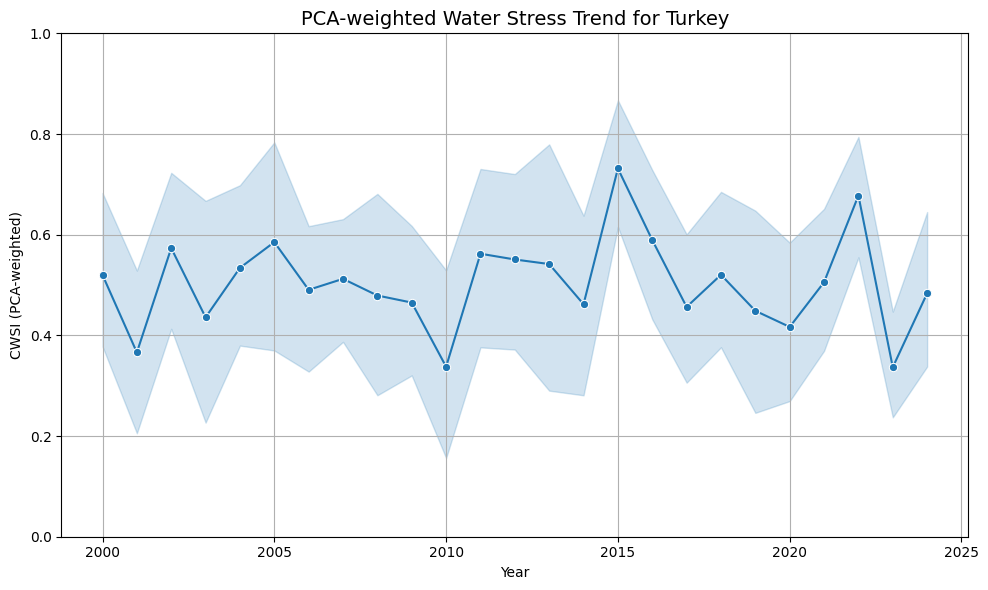

...

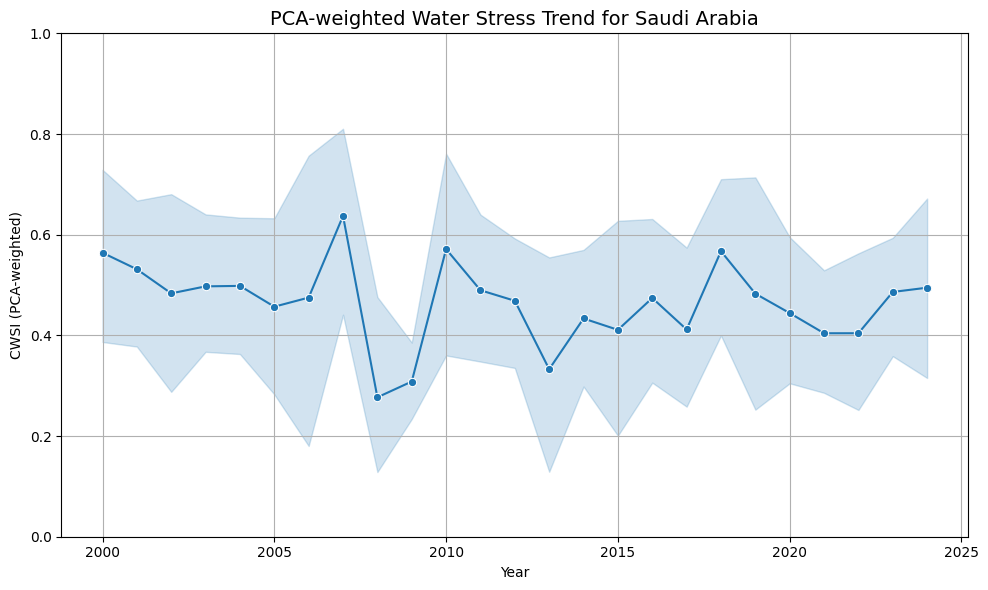

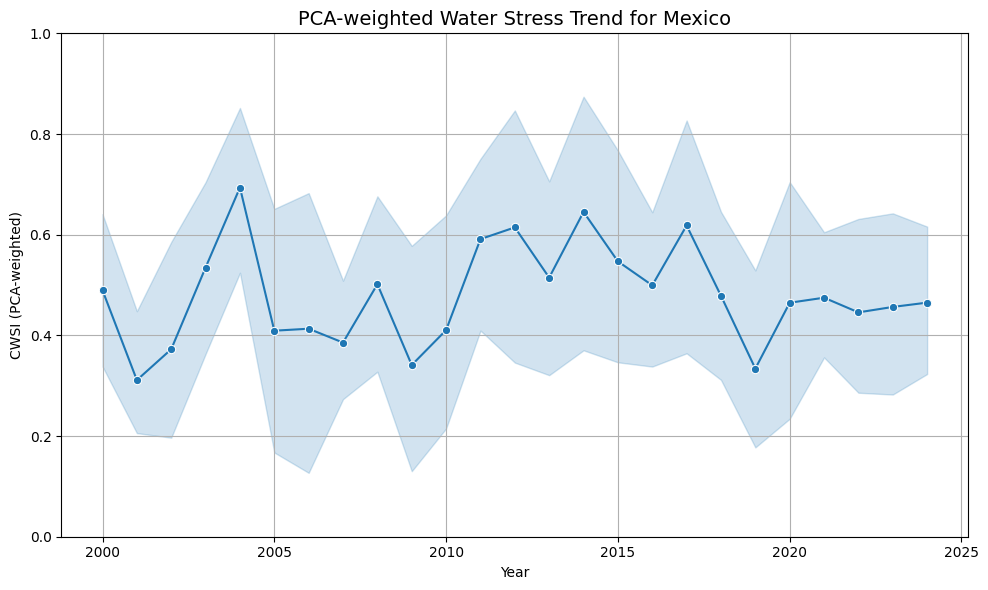

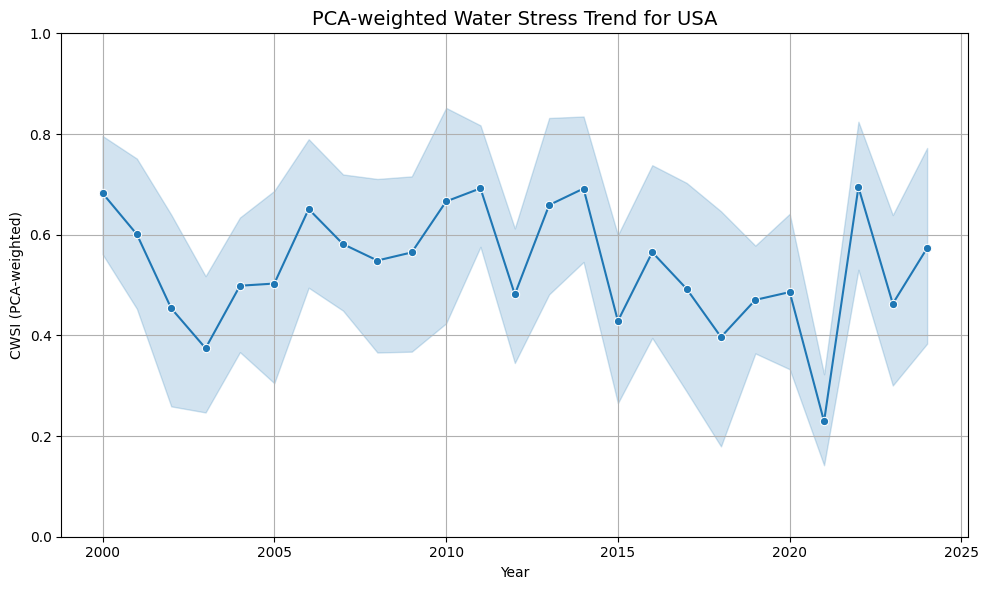

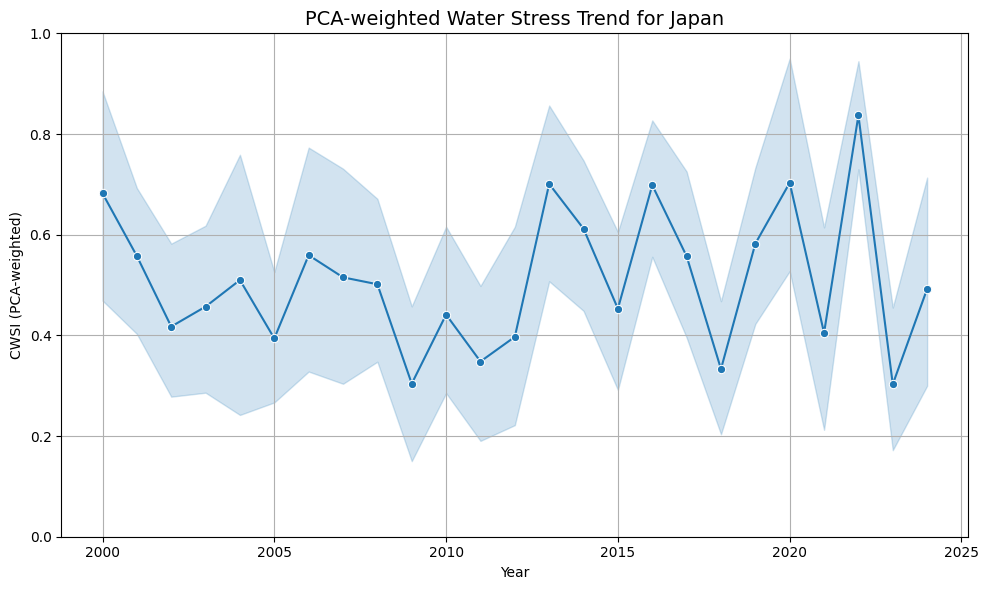

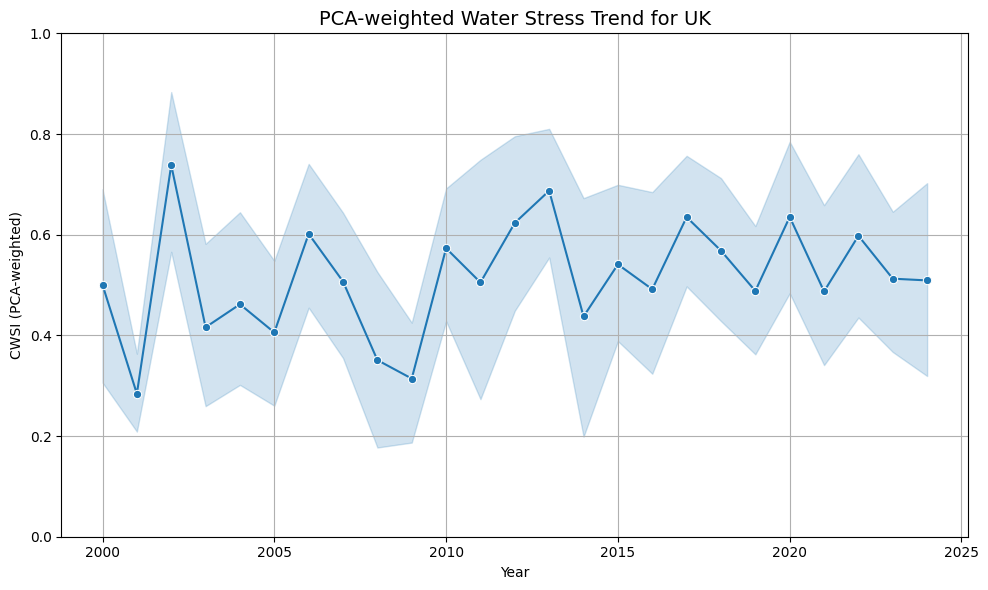

In [610]:
from sklearn.preprocessing import MinMaxScaler

# Step 1: Normalize numerical columns
scaler = MinMaxScaler()
df_normalized = df.copy()
df_normalized[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Step 2: Get PCA weights (ensure order matches)
weights = weights_df.set_index('Feature').loc[numerical_cols]['PCA_Weight'].values

# Step 3: Calculate PCA-weighted CWSI for each country-year
df_normalized['CWSI_PCA'] = df_normalized[numerical_cols].values.dot(weights)

# Step 4: Plot CWSI_PCA over years for each country
for country in df_normalized['Country_Label'].unique():
    country_data = df_normalized[df_normalized['Country_Label'] == country]

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=country_data, x='Year', y='CWSI_PCA', marker='o')
    plt.title(f'PCA-weighted Water Stress Trend for {country}', fontsize=14)
    plt.xlabel('Year')
    plt.ylabel('CWSI (PCA-weighted)')
    plt.grid(True)
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()
